# Demonstration of Augmentater

In [1]:
%load_ext autoreload
%autoreload 2  

import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict

import sys
sys.path.append("..")

from modules.inference.model import Detector
from modules.inference.nms import NMS
from modules.rectification.augmentation import Augmenter
from modules.utils.loss import Loss

---

#### **Task 4: Assignment Instructions:**
1. Define augmenter parameters (i.e., `kwargs = {'image': image, ...}`)
2. Initialize Augmenter
3. Display and demonstrate the following features by displaying 5 images for each method.
    - horizontal_flip
    - gaussian_blur
    - resize
    - change_brightness
    - transform
    - "your_custom_transformation"
4. Measure the loss for each of these transformation, and note any observations. 

**Reminder:**  
- Your notebook should be well-structured and clear for effective presentation. Up to 10 points may be deducted for poor structure and clarity.
- Consider this report as if it were being reviewed by **TechTrack stakeholders**. Keep it professional, insightful, and visually organized!
- Use visualizations, tables, and quantitative analysis where applicable to support your findings.

#

---

In [2]:
# A helper function to get annotations from a text file
def read_annotations(file_path):
    annotations = []
    with open(file_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_label = int(parts[0])
            bbox = list(map(float, parts[1:]))

            annotations.append([class_label, *bbox])

    return annotations

# A helper function to load images and annotations from given directory
def load_images_and_annotations(file_dir, num_file_pairs=5):
    image_files = []
    annotation_files = []
    file_pair_count = 0

    for file in os.listdir(file_dir):
        if file.endswith(".jpg"):
            image_files.append(file)
            annotation_files.append(file.replace(".jpg", ".txt")) # Get the corresponding annotation file name
            file_pair_count += 1
        if file_pair_count >= num_file_pairs:
            break
        
    # Check if any images were found
    if len(image_files) == 0:
        print("No images found in the specified folder.")
        return
    
    # Check if the number of images and annotations are the same
    if len(image_files) != len(annotation_files):
        print("Number of images and annotations are not the same.")
        return
    
    # Load the images and annotations
    images, annotations = [], []
    for i in range(len(image_files)):
        image_path = os.path.join(file_dir, image_files[i])
        image = cv2.imread(image_path)
        images.append(image)

        image_width, image_height = image.shape[1], image.shape[0]
        annotation_path = os.path.join(file_dir, annotation_files[i])

        # Convert the annotation to top-left coordinates to compare with predicted boxes for the localization Loss
        annotation = read_annotations(annotation_path) 
        annotations.append(annotation)
        
    return images, annotations

#  A helper function to draw boxes for given image
def draw_boxes(image, bboxes, class_ids, confidence_scores):
    h_img, w_img = image.shape[:2]  # Get image height and width

    for i, (x_center, y_center, w, h) in enumerate(bboxes):
        # Rescale coordinates from 0-1 to pixel values
        x_center, y_center, w, h = (
            x_center * w_img, 
            y_center * h_img, 
            w * w_img, 
            h * h_img
        )
        
        # Convert center-based coordinates to top-left-based
        x1 = int(x_center - w / 2)
        y1 = int(y_center - h / 2)
        x2 = int(x_center + w / 2)
        y2 = int(y_center + h / 2)

        # Draw bounding box
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Prepare label text
        label = f"Class {class_ids[i]}: {confidence_scores[i]:.2f}"

        # Put label text on the frame
        cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
        
    return image

# A helper function to display images in Jupyter Notebook
def display_images(images_1, images_2, title_1='Original', title_2='Augmented', n_rows=5):
    n_cols=2
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15))

    for i in range(n_rows):
        # Display the first list of images
        axes[i, 0].imshow(cv2.cvtColor(images_1[i], cv2.COLOR_BGR2RGB))
        axes[i, 0].axis("off")
        axes[i, 0].set_title(f"{title_1}: image_{i+1}")

        # Display the second image
        axes[i, 1].imshow(cv2.cvtColor(images_2[i], cv2.COLOR_BGR2RGB))
        axes[i, 1].axis("off")
        axes[i, 1].set_title(f"{title_2}: image_{i+1}")

    plt.tight_layout()
    plt.show()

#  A helper function to make detections and compute the loss for given images
def detect_and_measure(images, images_annotations, detector, measure):
    loss = []
    detected_images = []
    annotated_images = []

    for i, img in enumerate(images):
        # Get Predictions and compute the loss
        predictions = detector.predict(img)
        measures = measure.compute(predictions, images_annotations[i])
        loss.append({'image': i+1, **measures})

        # Draw identified bounding boxes on the image
        pred_bboxes, pred_class_ids, pred_scores, _ = measure.get_predictions(predictions)
        detect_img = draw_boxes(np.copy(img), pred_bboxes, pred_class_ids, pred_scores)
        detected_images.append(detect_img)

        # Draw annotated bounding boxes on the image
        anno_bboxes, anno_class_ids = measure.get_annotations(images_annotations[i])
        anno_scores = [1.0] * len(anno_bboxes)
        
        anno_img = draw_boxes(np.copy(img), anno_bboxes, anno_class_ids, anno_scores)
        annotated_images.append(anno_img)
        
    return pd.DataFrame(loss), detected_images, annotated_images

### Image Load
Here we load 5 images and the corresponding annotations from the given directory, to be applied for augmentations

Original image_1's annotations: [[16, 0.14609375, 0.42734375, 0.0234375, 0.0765625], [16, 0.32890625, 0.4125, 0.0203125, 0.078125], [16, 0.4484375, 0.43046875, 0.01875, 0.0765625]]


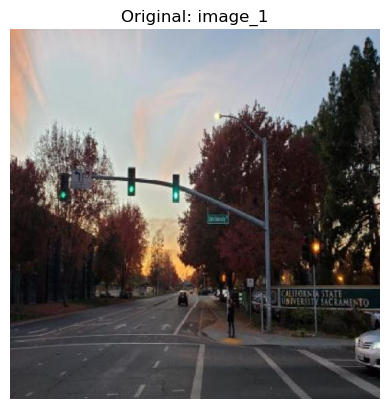

Original image_2's annotations: [[17, 0.3609375, 0.3796875, 0.5125, 0.759375]]


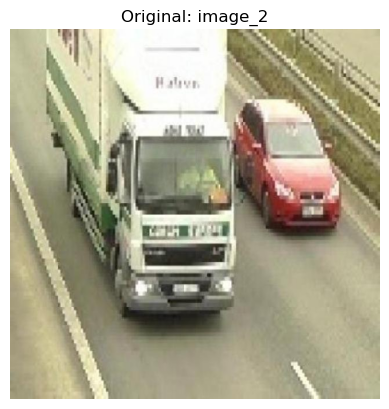

Original image_3's annotations: [[1, 0.18125, 0.61796875, 0.296875, 0.4109375], [1, 0.8421875, 0.653125, 0.20625, 0.303125], [1, 0.4375, 0.278125, 0.171875, 0.21875], [1, 0.38203125, 0.37890625, 0.1765625, 0.1859375], [1, 0.7921875, 0.490625, 0.1875, 0.175]]


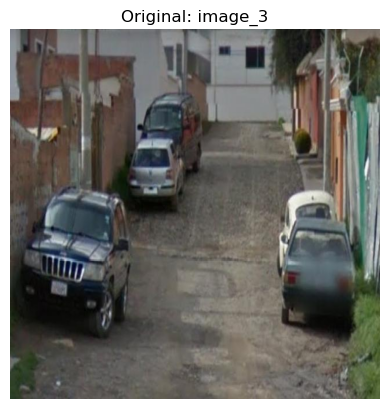

Original image_4's annotations: [[14, 0.75625, 0.4234375, 0.171875, 0.1]]


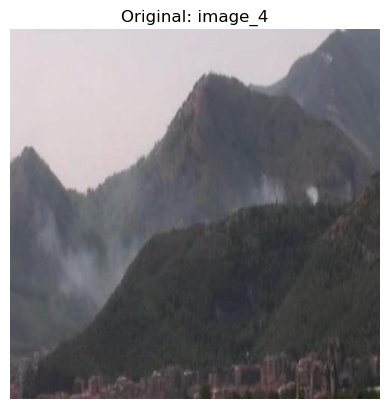

Original image_5's annotations: [[3, 0.496875, 0.4890625, 0.99375, 0.978125]]


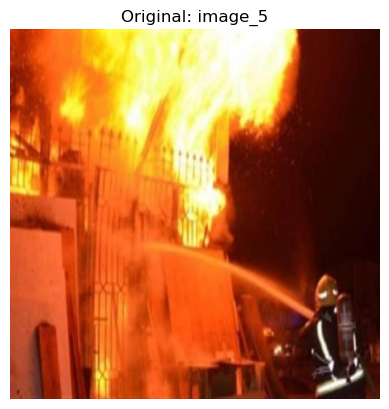

In [3]:
# Load 5 images and annotations from the given directory
IMAGE_DIR = '../storage/logistics/'
original_images, original_annotations = load_images_and_annotations(IMAGE_DIR)

# Display the original images and annotations
for i, img in enumerate(original_images):
    print(f"Original image_{i+1}'s annotations: {original_annotations[i]}")
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"Original: image_{i+1}")
    plt.axis("off")
    plt.show()


### Image Augmentation
The original images will be transformed in the following augmentation approaches to generate new ones.
- **horizontal_flip**
- **gaussian_blur**: gaussian kernel size of (21, 21) 
- **resize**: reduce the image size by half of both dimensions (width, height)
- **change_brightnes**s: darken the image by 100 brightness
- **transform**: transforma the image with random number of augmentationsas listed above
- **custom_transformation**: horizontally flip the images and then increase the brightness by 100.

In [4]:
# Define augmenter parameters
kwargs = {
    'gaussian_ksize': (21, 21), # gaussian kernel size
    'resize_fx': 0.5,  
    'resize_fy': 0.5,  # get half of the original dimensions
    'brightness_value': -100, # reduce the brightness by 100
}

# Initialize Augmenter and augmentation methods  
augmenter = Augmenter()
augmentations = [Augmenter.horizontal_flip, Augmenter.gaussian_blur, Augmenter.resize, Augmenter.change_brightness, Augmenter.transform]

# Apply augmentations to the images and annotations if needed 
augmented_images = defaultdict(list)
augmented_annotations = defaultdict(list)

for augment in augmentations:
    # Generate augmented images and transform annotations when needed.
    for i, original_img in enumerate(original_images):
        augmented_image, augmented_annotation = augment(image=np.copy(original_img), original_annotation=original_annotations[i], **kwargs)
        augmented_images[augment.__name__].append(augmented_image)
        augmented_annotations[augment.__name__].append(augmented_annotation)



#### Horizontal Flip
In this step, the original images are flipped horizontally, and displayed side by side with the original ones

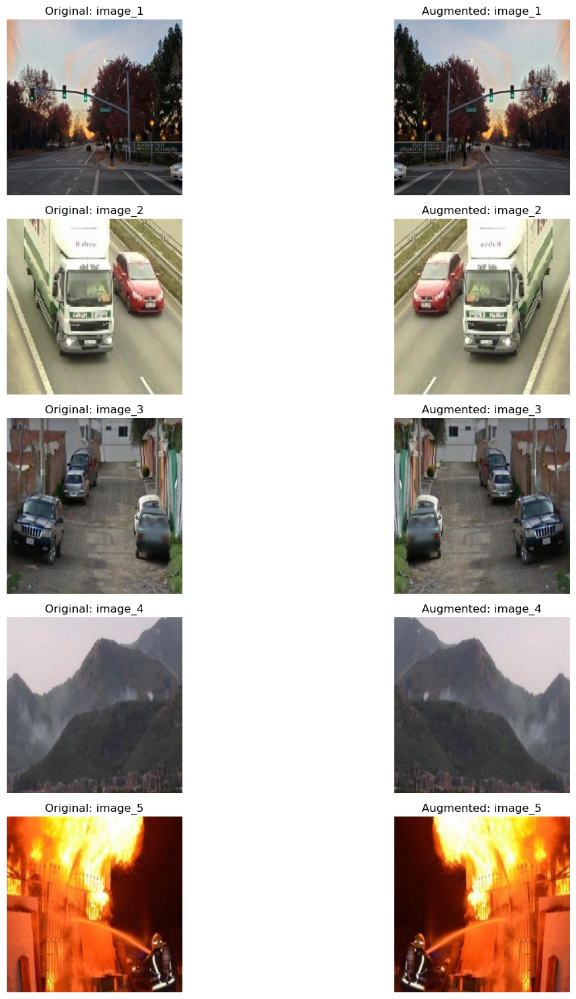

In [5]:
# Display the horizontal flipped images 
display_images(original_images, augmented_images['horizontal_flip'])

### Gaussian Blur
In this step, the original images are blurred with Gaussian kernel size (21, 21).

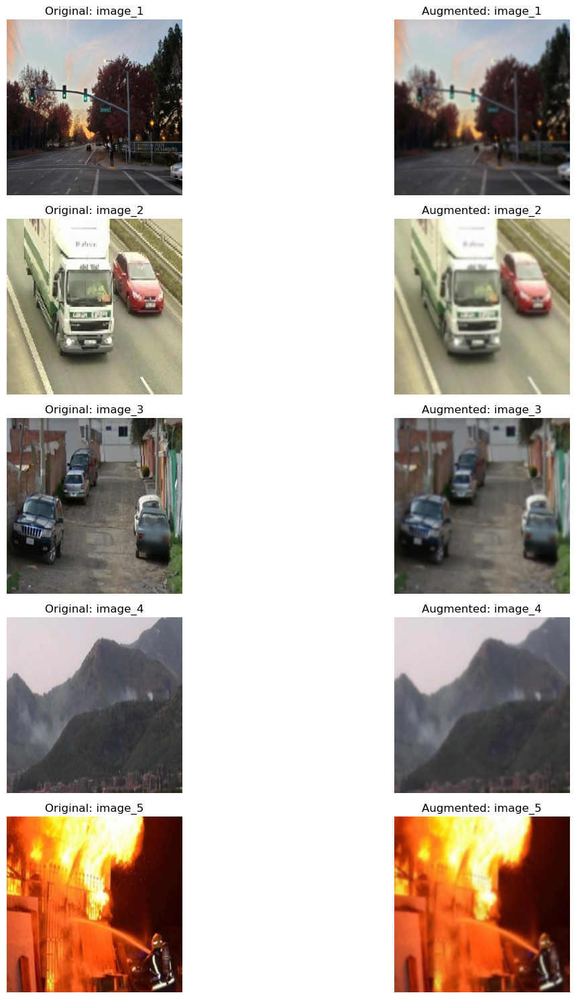

In [6]:
display_images(original_images, augmented_images['gaussian_blur'])

### Resize
In this step, the original images are resized by half of both dimensions

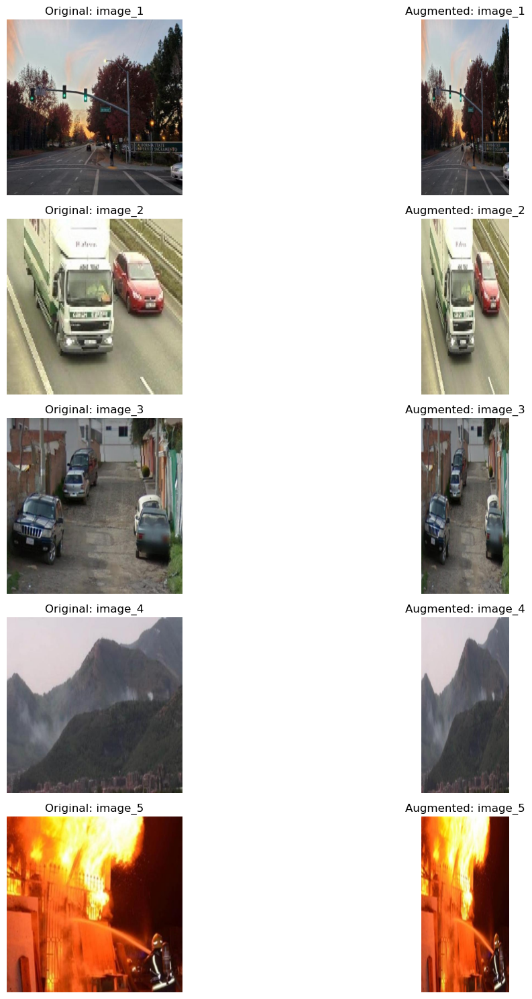

In [7]:
display_images(original_images, augmented_images['resize'])

### Brightness
In this step, the brightness of original images are darken by 100.

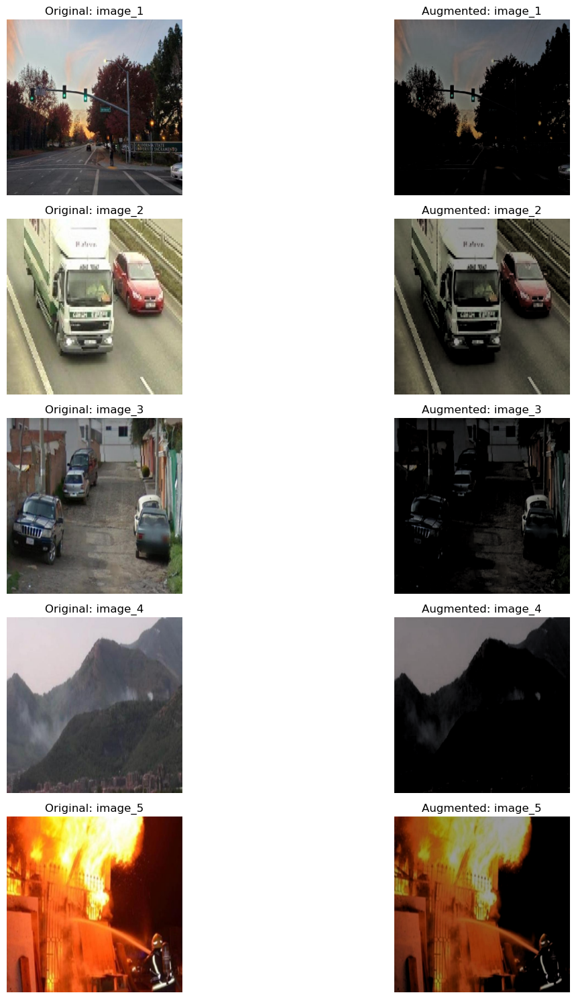

In [8]:
display_images(original_images, augmented_images['change_brightness'])

### Random Transform
In this step, the original images are augmented with random transformation approaches as listed above. The transformed images are displayed as below

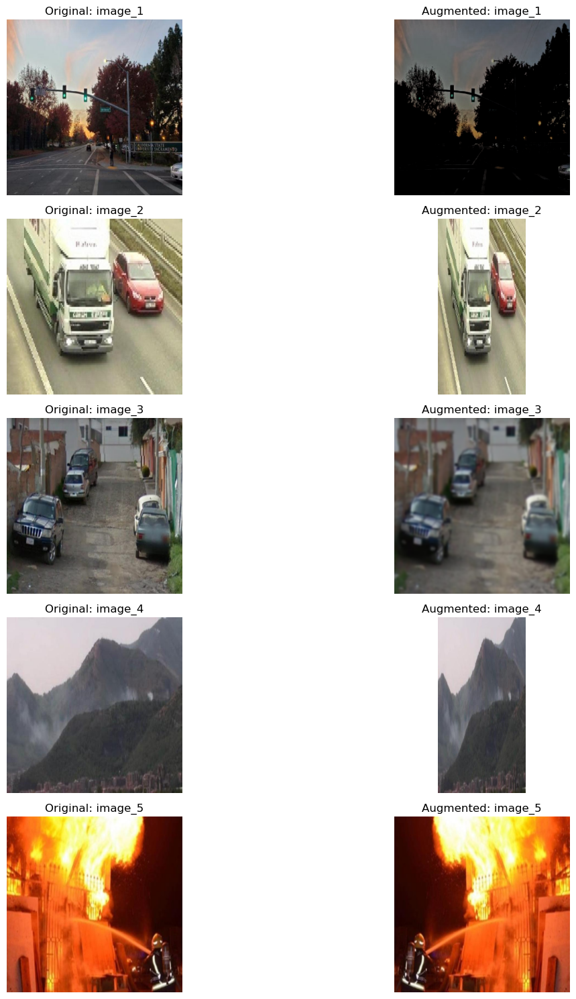

In [9]:
display_images(original_images, augmented_images['transform'])

### Custom Transform
In this step, the original images are flipped horizontally first, and then are brightened by 100. 

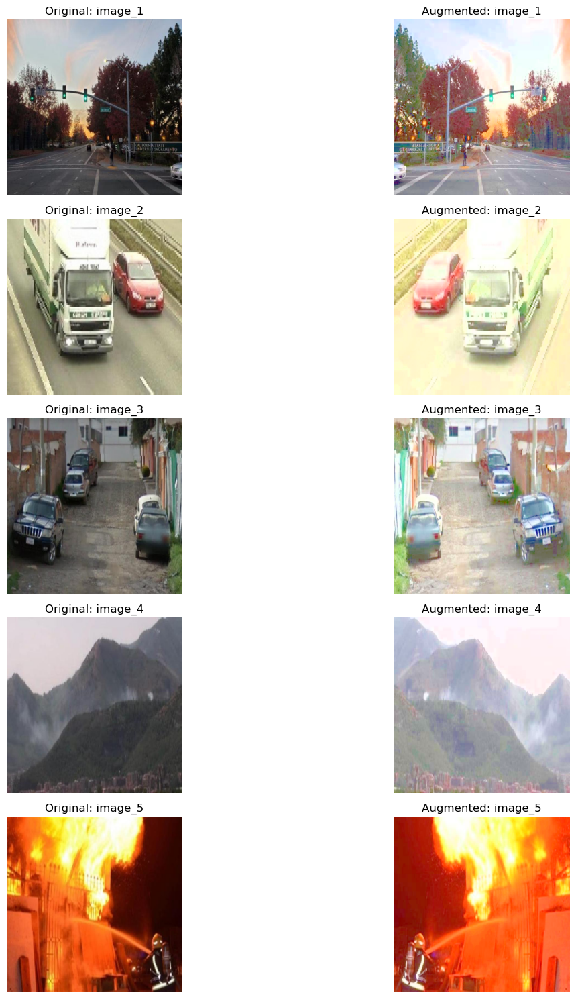

In [10]:
# Apply custom transformation to the images
for i, original_img in enumerate(original_images):
    horizontal_flip_image, horizontal_flip_anno = augmenter.horizontal_flip(image=np.copy(original_img), original_annotation = original_annotations[i])
    change_brightness_image, change_brightness_anno = augmenter.change_brightness(image=horizontal_flip_image, original_annotation = horizontal_flip_anno, brightness_value=100)
    augmented_images['custom_transform'].append(change_brightness_image)
    augmented_annotations['custom_transform'].append(change_brightness_anno)

display_images(original_images, augmented_images['custom_transform'])

### Loss Analysis
In this section, a YOLO model is initiated to make predictions on original images and augmented images.
Then the loss is calculated respectively for comparison.

In [11]:
# Initialize Model
WEIGHTS_PATH = "../storage/yolo_models/yolov4-tiny-logistics_size_416_1.weights"
CONFIG_PATH = "../storage/yolo_models/yolov4-tiny-logistics_size_416_1.cfg"
CLASS_NAMES_PATH = "../storage/yolo_models/logistics.names"
SCORE_THRESHOLD = 0.3

print("[INFO] Loading YOLO Model...")
detector = Detector(WEIGHTS_PATH, CONFIG_PATH, CLASS_NAMES_PATH, SCORE_THRESHOLD)
print("[INFO] Model loaded successfully.")

# Initialize Loss
measure = Loss() # apply default settings for loss computation
print("[INFO] Loss initialized.")

[INFO] Loading YOLO Model...
[INFO] Model loaded successfully.
[INFO] Loss initialized.


In [12]:
# Process with original images
loss_original, detected_images_original, annotated_images_original = detect_and_measure(original_images, original_annotations, detector, measure)
print(f"Original: \n{loss_original}")
print(f"Avg loc_loss: {loss_original.mean()['loc_loss'].round(4)}")
print(f"Avg conf_loss_obj: {loss_original.mean()['conf_loss_obj'].round(4)}")
print(f"Avg class_loss: {loss_original.mean()['class_loss'].round(4)}")
print("\n")

# Process with augment images
detected_images_augmented = defaultdict(list)
annotated_images_augmented = defaultdict(list)

for augment_name in augmented_images:
    loss_augmented, detected_images_augmented[augment_name], annotated_images_augmented[augment_name]= detect_and_measure(augmented_images[augment_name], augmented_annotations[augment_name], detector, measure)    
    print(f"Augmented by {augment_name}: \n{loss_augmented}")
    print(f"Avg loc_loss: {loss_augmented.mean()['loc_loss'].round(4)}")
    print(f"Avg conf_loss_obj: {loss_augmented.mean()['conf_loss_obj'].round(4)}")
    print(f"Avg class_loss: {loss_augmented.mean()['class_loss'].round(4)}")
    print("\n")

Original: 
   image  loc_loss  conf_loss_obj  class_loss  total_loss
0      1  0.002803      10.439231   10.441855   20.883889
1      2  0.990269      13.162567   20.869540   35.022376
2      3  0.550113      34.521874   38.759004   73.830992
3      4  0.000661       0.526017    0.690776    1.217453
4      5  0.000000       0.816341    0.000000    0.816341
Avg loc_loss: 0.3088
Avg conf_loss_obj: 11.8932
Avg class_loss: 14.1522


Augmented by horizontal_flip: 
   image  loc_loss  conf_loss_obj  class_loss  total_loss
0      1  0.003758      10.771239   11.799827   22.574824
1      2  1.250195      16.947783   22.936487   41.134465
2      3  0.489376      33.930557   36.016194   70.436126
3      4  0.009366       2.024600    2.763102    4.797068
4      5  0.000000       0.883018    0.000000    0.883018
Avg loc_loss: 0.3505
Avg conf_loss_obj: 12.9114
Avg class_loss: 14.7031


Augmented by gaussian_blur: 
   image  loc_loss  conf_loss_obj  class_loss  total_loss
0      1  0.001402       4.

#### 1. Baseline with original images

The object detection model employs a loss function that integrates three primary components:

1. Localization Loss: This measures the error in predicting the bounding box coordinates (center, width, and height) for an object. Accurate localization is crucial for precise object detection.

2. Confidence (Objectness) Loss: This evaluates the model's confidence in the presence of an object within a predicted bounding box. It penalizes both false positives (predicting an object when there isn't one) and false negatives (failing to predict an object when there is one).

3. Classification Loss: This assesses the error in correctly classifying the detected object into one of the predefined categories.

The detections on original images provide a baseline measurement of loss as: 
* Avg loc_loss: 0.3088
* Avg conf_loss_obj: 11.8932
* Avg class_loss: 14.1522


**Key Findings**

1. **False negative measurement is not prioritized in Loss**

    In the case of false negatives (FNs), no bounding box is predicted at all, meaning there is no confidence score nor class_id associated with the missing detection. One reason is, in practice there are usually more false positives (FP) than false negatives (FN) (as illustrated in the figure below), and thus for Loss we don't want to over penalize FN which may introduce more FPs in the result. 

2. **Better to make comparisons by each loss component, rather than the total_loss**
    
    In this project, default settings are applied for the loss computation by having the same weights for localization loss, objectness loss, no objectness loss, and classification loss.
    However, the loss components are calculated using different methods. For example, MSE is applied for localization loss and cross-entropy for classification loss, which would give the results in different scales.
    
    It would make the total_loss less comparable across different sets of iamges, as it's aggregated from the 3 loss components. 
    Say, if the regression loss is always smaller than cross-entropy, then the total loss for image set with more classification errors will be higher than those with less classification error but more localization error.

    Thus, total_loss is not quite comparable, unless the scale of Loss components is better aligned.

    However, we can have the comparison based on each loss component, as they are consistent across the board. In addition, they can provide us with more clear message about how the model is performing - whether there are more mistakenly identified objects, or more mis-classifications, etc.

3. **The quality of human annotation needs improvement**

    By looking at the annotated images, we can find that some annoations are not very accurate. 

    For example, in the first image, there is a car at the bottom right, but not captured by the human annoation. Similarly for image 2, the red car was not identifed. For image 4, the human annotated a road sign, but it seems to be a false flag from my reads. 



Display the annotatation and detection for original images 


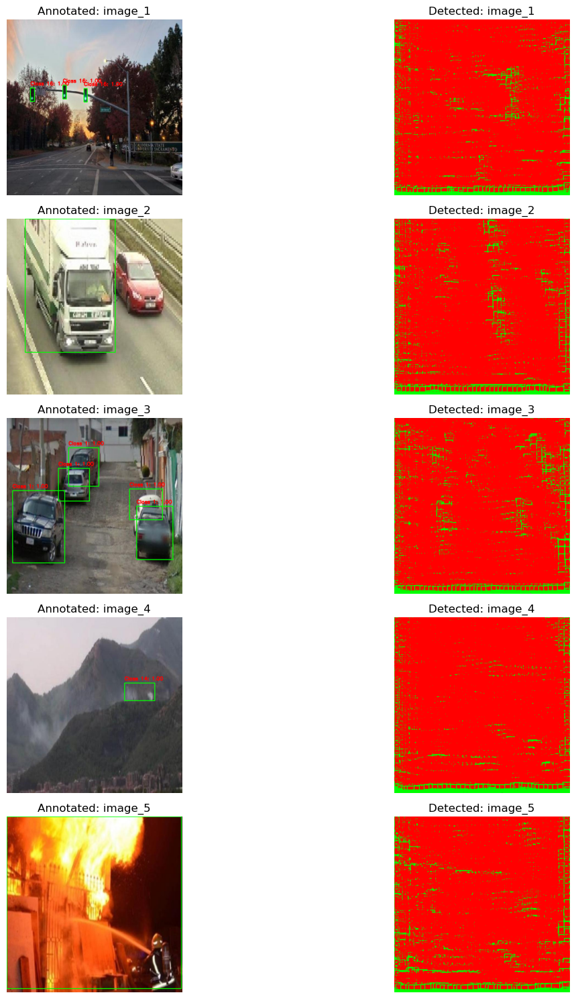

In [13]:
print(f"Display the annotatation and detection for original images ")
display_images(annotated_images_original, detected_images_original, title_1='Annotated', title_2='Detected')

#### 2. Horizonal Flip
For horizontal flipped images, the annotated boundboxes are also flipped to represent the corresponding objects correctly. The loss is computed based on flipped annotation and detections.

Impact on Loss
* Avg loc_loss - 13.5% increase is observed from 0.3088 to 0.3505 
* Avg conf_loss_obj - 8.6% increase from 11.8932 to 12.9114
* Avg class_loss - 3.9% increase from 14.1522 to 14.7031

In general, the horizonal flip wont affect performance if the image is horizontally symmetric. Also it will have less impact for symmetric objects. 

For increased loss in 3 components, one possible reason could be the model asymmetry. If the model has been trained predominantly on non-flipped images, it may have learned directional biases in how bounding boxes are predicted. For example, it might be more precise when objects are facing right but struggle when they face left after flipping. 

Similarly, the model may struggle with flipped objects, causing higher objectness loss. 

Also, for classification loss, if the training dataset contains fewer horizontally flipped images, the model may not have learned how to correctly classify flipped objects.



Display the annotatation and detection for horizontally flipped images


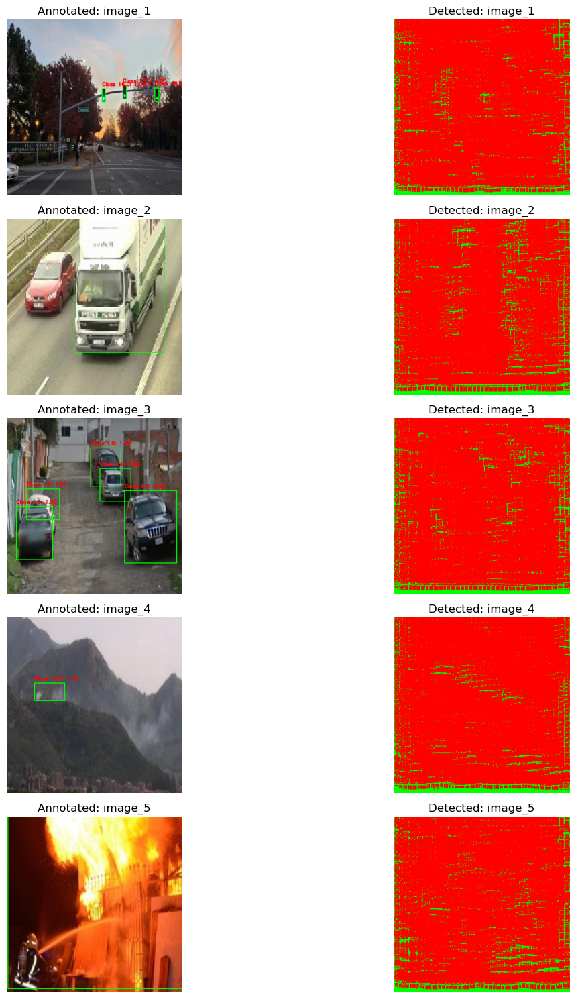

In [21]:
print(f"Display the annotatation and detection for horizontally flipped images")
display_images(annotated_images_augmented['horizontal_flip'], detected_images_augmented['horizontal_flip'], title_1='Annotated', title_2='Detected')

#### 3. Gaussian Blur	
For blurred images, the annotated boundboxes remained the same as for the original ones.

Impact on Loss
* Avg loc_loss - slightly decreased (by ~2.8%) from 0.3088 to 0.3002 
* Avg conf_loss_obj - decreased from 11.8932 to 8.9911
* Avg class_loss - decreased from 14.1522 to 12.1732

In general, a blurred image would introduce higher loss, as the object may lose features and are harder to distinguish.

However, the loss became lower in this case, especially for objectness and classification. One assumption is, there are too many false positives in the original detections, leading to a relatively high loss. When the iamge is blurred, the model made less (false postive) predictions, which decreased the loss.



Display the annotatation and detection for Gaussian blurred images


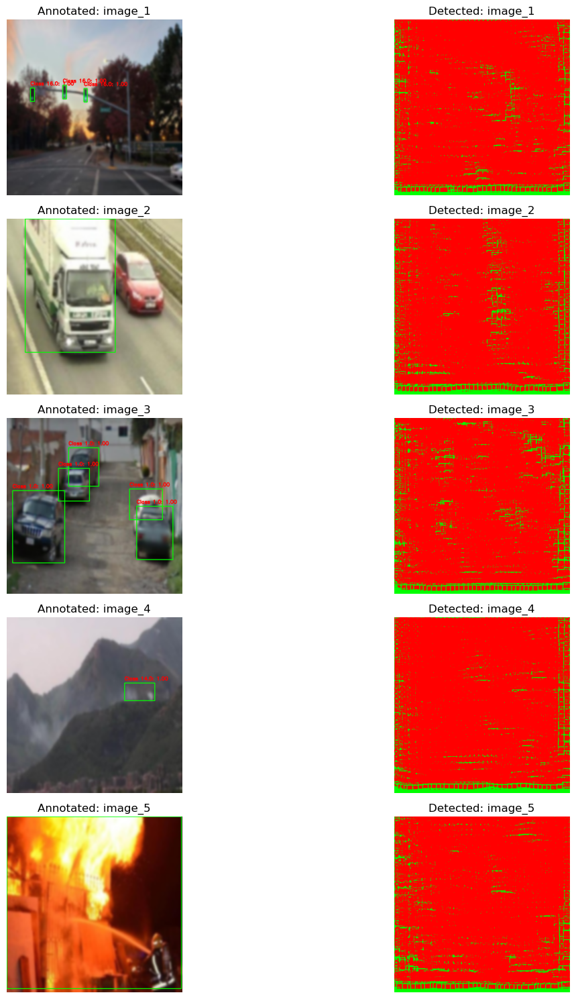

In [15]:
print(f"Display the annotatation and detection for Gaussian blurred images")
display_images(annotated_images_augmented['gaussian_blur'], detected_images_augmented['gaussian_blur'], title_1='Annotated', title_2='Detected')

#### 4. Resize (by half of both dimensions)

Impact on Loss
* Avg loc_loss - increased from 0.3088 to 0.3519
* Avg conf_loss_obj - decreased from 11.8932 to 9.2486
* Avg class_loss - decreased from 14.1522 to 3.039411.5081

For increased localization loss, a possible reason is the loss of detail due to downsampling. As objects become smaller with resized image, it's harder for the model to detect precise bounding box locations. 

For decreased objectness loss, it may be caused by the reduced background noise in smaller image, allowing the model to focus better on object.

For decreased classification loss, one reason could be the reduced classification noise, as smaller images remove minor features, making the classification decision more straightforward. Another possible reason is that the model is less likely to be overfitting to small details. That is, if the model was overfitting to high-frequency details in the original images, downsizing might help it focus on more general shape-based features, leading to lower classification loss. 

Display the annotatation and detection for Resized images


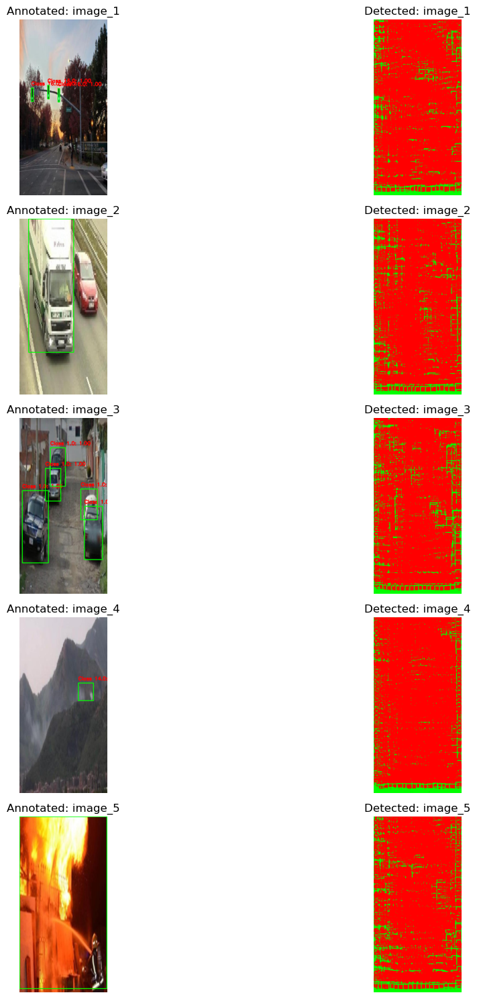

In [16]:
print(f"Display the annotatation and detection for Resized images")
display_images(annotated_images_augmented['resize'], detected_images_augmented['resize'], title_1='Annotated', title_2='Detected')

#### 5. Change brightness (Darken by 100)

Impact on Loss
* Avg loc_loss - increased from 0.3088 to 0.3357
* Avg conf_loss_obj - decreased from 11.8932 to 8.89
* Avg class_loss - decreased from 14.1522 to 12.18

The localization loss for darken image increased, as some objects may blend into the background, making it harder to detect.

The objectness loss and classification loss decreased. One reason could be that the background becomes less distracting, and thus less false positives are detected. Also, with darken background, surroundings of objects become less noisy, the classifier might predict class labels with higher confidence, leading to lower classification loss.


Display the annotatation and detection for Darkened images


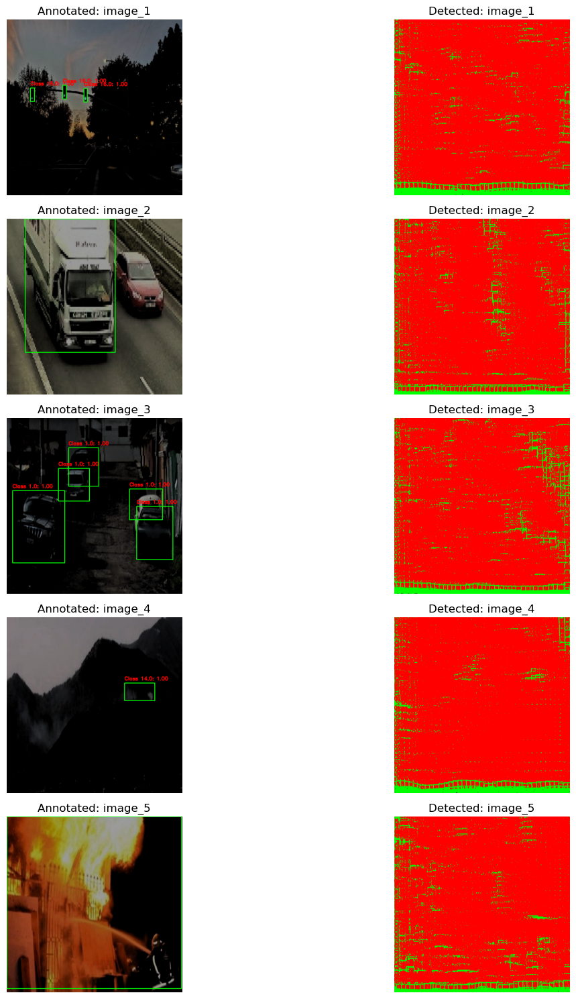

In [18]:
print(f"Display the annotatation and detection for Darkened images")
display_images(annotated_images_augmented['change_brightness'], detected_images_augmented['change_brightness'], title_1='Annotated', title_2='Detected')

#### 6. Transform

Impact on Loss
* Avg loc_loss - decreased from 0.3088 to 0.2437
* Avg conf_loss_obj - decreased from 11.8932 to 9.6384
* Avg class_loss - decreased from 14.1522 to 12.468

Here we applied random augmentations from the available methods as listed above. All the Loss components decreased from the result. The reason could be similar to the cases above, that the background noise was reduced and thus the detections could be more effective.

Display the annotatation and detection for Randomly Transformed images


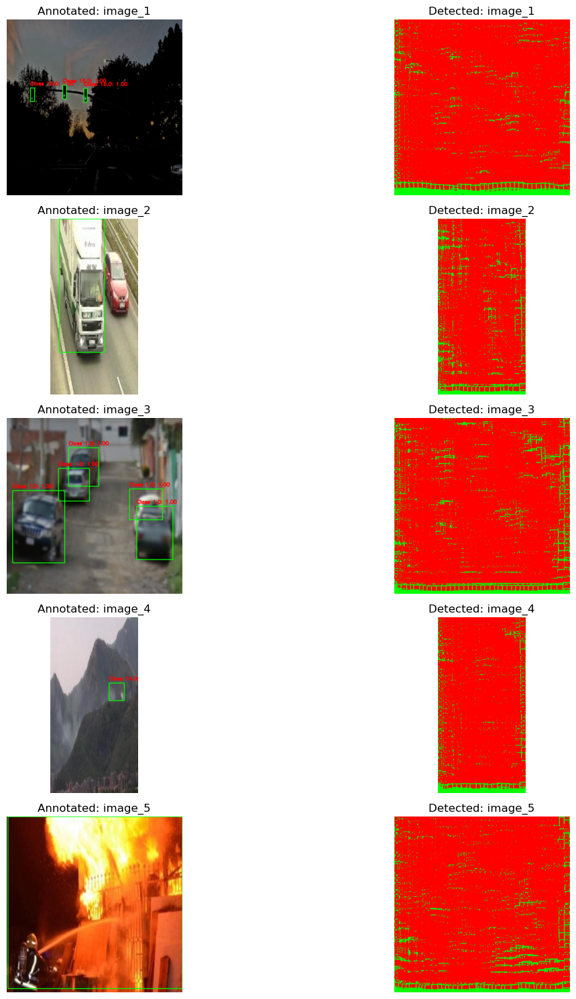

In [19]:
print(f"Display the annotatation and detection for Randomly Transformed images")
display_images(annotated_images_augmented['transform'], detected_images_augmented['transform'], title_1='Annotated', title_2='Detected')

#### 7. Custom Transform (Horizontal Flip + Brighten by 100)

Impact on Loss
* Avg loc_loss - slightly decrease from 0.3088 to 0.3025 (by ~2% )
* Avg conf_loss_obj - slightly increased from 11.8932 to 11.936 (by ~0.3%)
* Avg class_loss - slightly decreased from 14.1522 to 14.1224 (by ~0.2%)

In this case, minimal difference (<=2%) was observed based on the given set of images. 

Display the annotatation and detection for Flipped and Brightened images


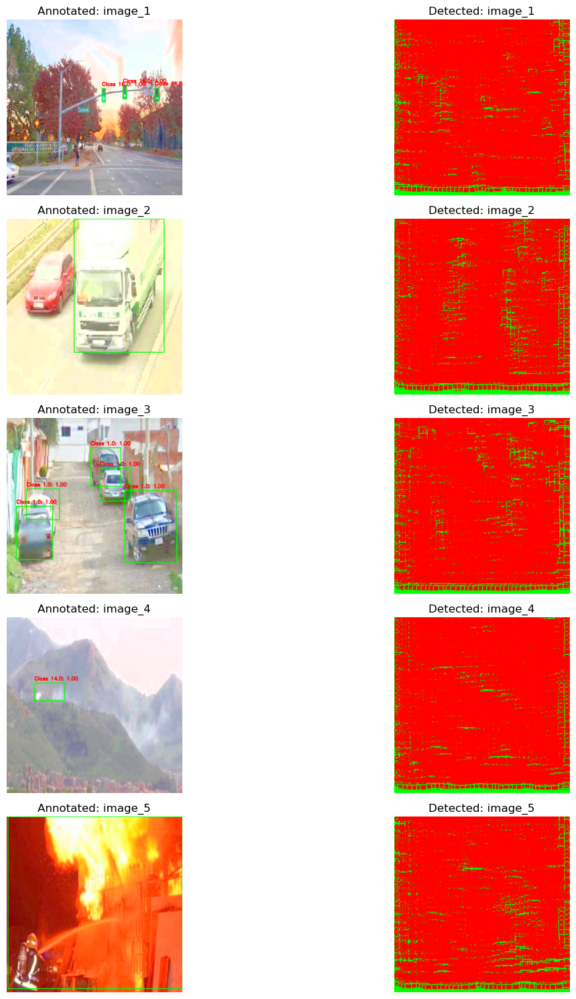

In [20]:
print(f"Display the annotatation and detection for Flipped and Brightened images")
display_images(annotated_images_augmented['custom_transform'], detected_images_augmented['custom_transform'], title_1='Annotated', title_2='Detected')

> Note that the observations above are based on the test set of 5 images, which can be noisy given the small size of sample.

#### Key Learnings

**1. Reducing background noise is important.**

Since the loss is calculated based on raw predictions, rather than the filtered ones (like nms), false positives could be a dominant issue. Thus reducing the background noise could be helpful to this case to improve the performance.

**2. Augmented data can help reduce model overfitting.**

Augmented images can help the model learn invariant features by exposing it to variations of the same object (e.g., different perspectives, orientations, scales, bluriness, brightness levels, etc). It reduces overfitting to the training dataset, making the model perform better on unseen data.

Particularly, if the loss on augmented images is higher than on original images, the model may be struggling to generalize to the new variations.

If the loss on augmented images decreases over time, it indicates that the model is successfully learning to detect objects despite transformations.
